# Representação Gráfica / Plotagem - "Plotting"

Prof. Daniel de Abreu Pereira Uhr

### Conteúdo

* Introdução
* Certifique-se de ter as bibliotecas necessárias instaladas
* Importando os Dados
* Limpeza e Preparação dos Dados
* Configurações para Plotagem
* Plotagem dos Dados
  * Histograma
  * Histograma e Kernel Density Estimation (KDE)
  * Gráfico de Barras - Contagem
  * Gráfico de Barras - Médias
  * Gráfico de Barras - Mediana
  * Gráfico de Caixas - Boxplot
  * Gráfico de Violino - Violin Plot
  * Gráfico de Linha temporal - Time Series
  * Gráfico de Dispersão - Scatter Plot
  * Gráfico de Dispersão - Bins Scatter Plot
  * Gráfico de Dispersão Bivariado - com Histogramas Marginais
  * Gráficos de Correlação - Pairplot
  * Mapa de Calor - Heatmap
  * Mapa Geográfico/Espacial - Localização Espacial
  * Gráfico de densidade entre dois grupos - KDE
* Considerações Finais

### Referências

* [Introduction to Statistical Learning](https://www.statlearning.com/) by Gareth James, Daniela Witten, Trevor Hastie and Robert Tibshirani 
* [Python Data Science Handbook](https://jakevdp.github.io/PythonDataScienceHandbook/) by Jake VanderPlas
* [Python (Documentação Oficial)](https://docs.python.org/3/)
* [NumPy (Array e Computação Numérica)](https://numpy.org/doc/stable/)
* [Pandas (Manipulação e Análise de Dados)](https://pandas.pydata.org/docs/)
* [Matplotlib (Visualização de Dados)](https://matplotlib.org/contents.html)
* [Seaborn (Visualização de Dados)](https://seaborn.pydata.org/)
* [Geopandas (Visualização de Dados Geográficos)](https://geopandas.org/)
* [Contextily (Visualização de Dados Geográficos)](https://contextily.readthedocs.io/en/latest/)
* [Folium (Visualização de Dados Geográficos)](https://python-visualization.github.io/folium/)



### Introdução

Este notebook apresenta diferentes técnicas de visualização de dados em Python, utilizando as bibliotecas `Matplotlib` e `Seaborn`.

Objetivos:
- Aprender a construir gráficos básicos e avançados.
- Entender como personalizar gráficos para melhor visualização dos dados.
- Explorar diferentes tipos de visualizações adequadas para distintos conjuntos de dados.

Bibliotecas utilizadas:
- `Matplotlib`
- `Seaborn`
- `folium`
- `contextily`
- `geopandas`


### Certifique-se de ter as bibliotecas necessárias instaladas

Você pode instalá-las usando o pip:

```python	
pip install numpy pandas matplotlib seaborn folium geopandas contextily
```	


### Importando os dados

Nós usaremos, novamente, os dados "raspados" (Scraped) do AirBnb para a cidade de Bolonha. Os dados estão disponíveis gratuitamente em Inside AirBnb : http://insideairbnb.com/get-the-data.html .

Usaremos 2 conjuntos de dados:

* conjunto de dados de listagem: contém informações de nível de listagem
* conjunto de dados de preços: contém dados de preços ao longo do tempo

In [1]:
import numpy as np
import pandas as pd

import folium
import geopandas
import contextily
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

Repare que temos novas bibliotecas que serão utilizadas:

* folium: para plotagem de mapas interativos
* geopandas: para plotagem de dados geográficos
* contextily: para adicionar mapas de fundo a gráficos geográficos
* matplotlib: para plotagem de gráficos
* seaborn: para plotagem de gráficos

In [2]:
# Importando "listings data"
url_listings = "http://data.insideairbnb.com/italy/emilia-romagna/bologna/2021-12-17/data/listings.csv.gz"
df_listings = pd.read_csv(url_listings)

# Importando "calendar data"
url_calendar = "http://data.insideairbnb.com/italy/emilia-romagna/bologna/2021-12-17/data/calendar.csv.gz"
# Vamos chamar o arquivo de "df_prices" para facilitar a manipulação
df_prices = pd.read_csv(url_calendar, compression="gzip")

### Limpeza e Preparação dos Dados

Primeiramente, vamos pegar a `df_prices` de uma *string* formatada como valor monetário para um número do tipo *float*

In [3]:
df_prices['price'] = df_prices['price'].str.replace('[$|,]', '', regex=True).astype(float)

Repare que estamos fazendo algumas operações de limpeza e preparação dos dados:

1. `df_prices['price'].str.replace('[$|,]', '', regex=True)`
* `str.replace('[$|,]', '', regex=True)` → Remove símbolos de dólar ($) e vírgulas (,) da string.
* Explicação do regex `[$|,]`:
  * [ e ] → Define um conjunto de caracteres a serem substituídos.
  * $ → Representa o símbolo de dólar.
  * , → Representa a vírgula usada em separação de milhares.
  * | dentro do conjunto [$|,] não é necessário, pois dentro de colchetes ([]), cada caractere é tratado separadamente.
2. .astype(float)
   * Converte os valores da coluna de string para tipo float.

Isso permite operações matemáticas como soma, média, gráficos etc.


Agora vamos converter a coluna 'date' para o formato de data (datetime) no Pandas

In [4]:
df_prices['date'] = pd.to_datetime(df_prices['date'], format='%Y-%m-%d')

Ou seja, fizemos:
* `df_prices['date']` → Seleciona a coluna 'date' do DataFrame.
* `pd.to_datetime(df_prices['date'], format='%Y-%m-%d')` → Converte os valores da coluna para o tipo datetime, garantindo que estejam no formato correto (YYYY-MM-DD).

Agora convertemos a coluna 'available' em valores booleanos (True ou False), verificando se o valor da célula é 'f' (false no contexto dos dados do Airbnb).

In [5]:
df_prices['available'] = df_prices['available']=='f'

* `df_prices['available']` → Seleciona a coluna 'available' do DataFrame.
* `df_prices['available'] == 'f'` → Verifica se cada valor da coluna é igual a 'f' (False no banco de dados).
* Atribuição do resultado → Os valores True/False substituem os valores originais da coluna.

Avançando para o outro dataframe:

In [6]:
# Cleaning listings data
df_listings['price'] = df_listings['price'].str.replace('[$|,]', '', regex=True).astype(float)
df_listings = df_listings[['id', 'name', 'neighbourhood_cleansed', 'latitude', 'longitude', 'price',
                               'host_id', 'host_name', 'host_response_time', 'host_response_rate', 'host_acceptance_rate',
                               'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities',
                               'number_of_reviews', 'reviews_per_month', 'first_review', 'last_review', 'review_scores_rating']]


O primeiro código remove os caracteres $ (dólar) e , (vírgula) da coluna price usando str.replace(). Isso é comum porque preços frequentemente vêm formatados como "1,200.50" ou "$900", e esses caracteres impedem a conversão para número.
Converte a coluna para tipo float para que seja tratada corretamente como um valor numérico.

O segundo código mantém apenas as colunas relevantes no DataFrame df_listings, descartando as demais.

Próxima etapa é renomear as colunas:

In [7]:
df_listings = df_listings.rename(columns={'id': 'listing_id',
                                              'name': 'listing_title',
                                              'price': 'mean_price',
                                              'neighbourhood_cleansed': 'neighborhood'})

Agora vamos montar um único dataframe, juntando os dois dataframes com base na coluna 'listing_id'. Para isso, vamos renomeamos a coluna 'id' do dataframe de listagem para 'listing_id', para que possamos fazer a junção corretamente.

In [8]:
# Merge
df = pd.merge(df_listings, df_prices, on='listing_id', how='inner')

### Configurações para Plotagem

Agora vamos definir algumas configurações para a plotagem dos gráficos:

In [9]:
%matplotlib inline

`%matplotlib inline`é usado no Jupyter Notebook para exibir gráficos diretamente dentro da célula de execução, em vez de abrir uma nova janela externa.

Outra configuração importante é a resolução do gráfico. Nós o configuramos para gráficos de alta resolução.

In [10]:
%config InlineBackend.figure_format = 'retina'

`config InlineBackend.figure_format = 'retina'` é usado no Jupyter Notebook para melhorar a qualidade dos gráficos gerados pelo Matplotlib. Ele configura o formato de exibição dos gráficos no backend do Jupyter, tornando-os mais nítidos, especialmente em telas de alta resolução (Retina displays).

In [11]:
mpl.rcParams['figure.figsize'] = (10,6)
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['axes.titlesize'] = 18
mpl.rcParams['axes.titleweight'] = 'bold'
mpl.rcParams['figure.titlesize'] = 18
mpl.rcParams['figure.titleweight'] = 'bold'
mpl.rcParams['axes.titlepad'] = 20
mpl.rcParams['legend.facecolor'] = 'w'

***Explicação de Cada Linha***:

1. **`mpl.rcParams['figure.figsize'] = (10,6)`**  
   - Define o **tamanho padrão das figuras** geradas pelo Matplotlib.  
   - **(10,6)** → Largura = 10 polegadas, Altura = 6 polegadas.

2. **`mpl.rcParams['axes.labelsize'] = 16`**  
   - Define o **tamanho da fonte dos rótulos dos eixos (xlabel, ylabel)**.  
   - **16** → Fonte maior para melhorar a leitura.

3. **`mpl.rcParams['axes.titlesize'] = 18`**  
   - Define o **tamanho da fonte do título do gráfico**.  
   - **18** → Título maior para melhor destaque.

4. **`mpl.rcParams['axes.titleweight'] = 'bold'`**  
   - Define o **peso da fonte** do título dos gráficos.  
   - **'bold'** → Negrito.

5. **`mpl.rcParams['figure.titlesize'] = 18`**  
   - Define o **tamanho da fonte do título da figura inteira**.  
   - Útil quando se usa `plt.suptitle("Título Principal")`.

6. **`mpl.rcParams['figure.titleweight'] = 'bold'`**  
   - Define o **peso da fonte do título da figura inteira**.  
   - **'bold'** → Negrito.

7. **`mpl.rcParams['axes.titlepad'] = 20`**  
   - Define o **espaçamento entre o título do gráfico e o gráfico em si**.  
   - **20** → Maior distância do título para o gráfico.

8. **`mpl.rcParams['legend.facecolor'] = 'w'`**  
   - Define a **cor de fundo da legenda**.  
   - **'w'** → Branco.


### Plotagem dos Dados

Criar uma nova coluna no dataframe df_listings chamada 'log_price' que contém o logaritmo natural dos preços das listagens. Ou seja, queremos realizar a transformação logarítmica na coluna mean_price do DataFrame df_listings, e armazenando o resultado em uma nova coluna chamada log_price

In [12]:
df_listings['log_price'] = np.log(1+df_listings['mean_price'])

OBS: O uso de log(1 + x) é uma técnica comum para evitar problemas com valores zero, pois o logaritmo de zero não está definido (log(0) → -∞). O acréscimo de 1 garante que mesmo valores 0 sejam transformados corretamente (log(1) → 0).

#### Histograma

Agora vamos criar um histograma da variável log_price usando a biblioteca Seaborn (sns), com 50 bins e um título personalizado.

Obs: Cada barra no histograma representa um bin (intervalo de valores)

[Text(0.5, 1.0, 'Distribution of log-prices')]

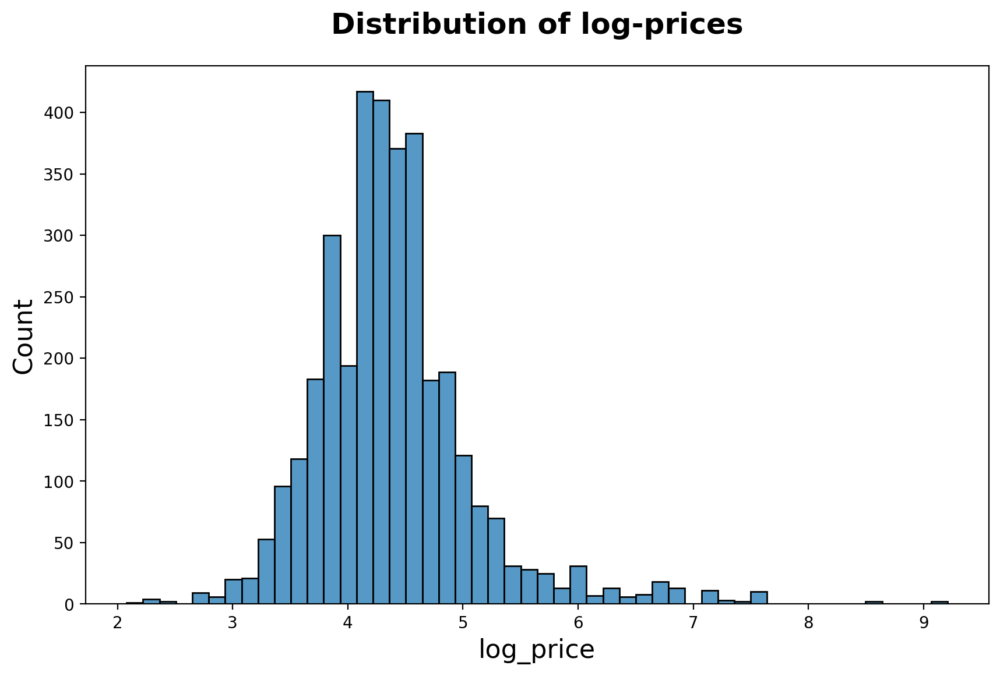

In [13]:
sns.histplot(df_listings['log_price'], bins=50).set(title='Distribution of log-prices')

#### Histograma e Kernel Density Estimation (KDE)

* Vamos adicionar um estimador de densidade kernel (KDE - Kernel Density Estimation) para visualizar a distribuição dos dados de forma mais suave
  * KDE (Kernel Density Estimation) cria uma curva suave que aproxima a distribuição dos dados.
  * Ele ajuda a visualizar padrões e tendências sem a segmentação brusca dos bins do histograma.

[Text(0.5, 1.0, 'Distribution of log-prices with density')]

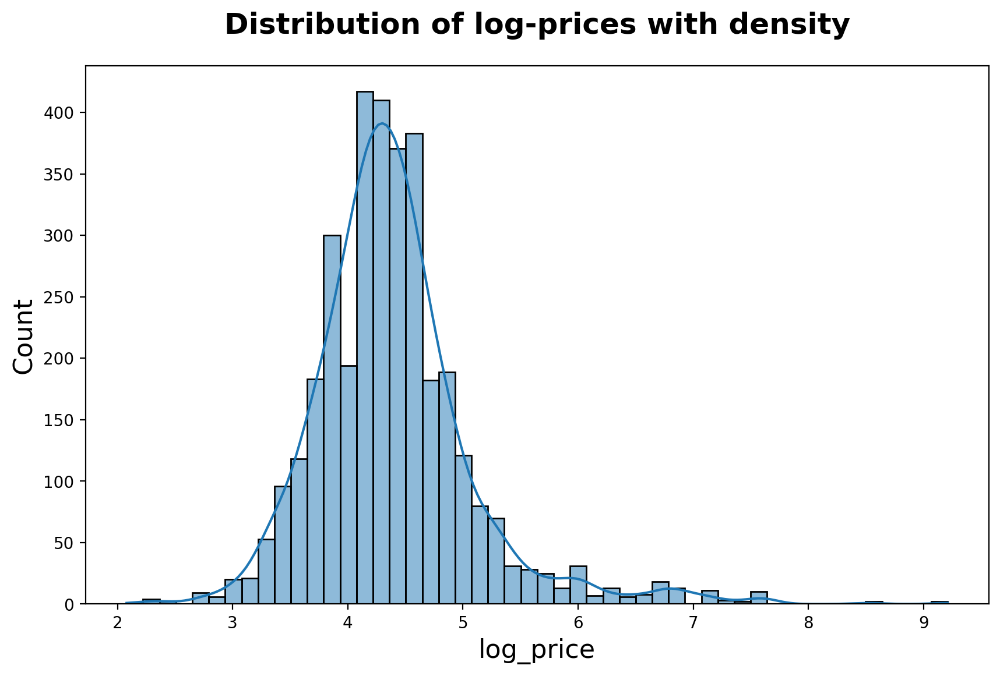

In [14]:
sns.histplot(df_listings['log_price'], bins=50, kde=True).set(title='Distribution of log-prices with density')

#### Gráfico de Barras - Contagem

Vamos um gráfico de contagem (bar plot) que exibe a quantidade de observações (anúncios) em cada bairro (neighborhood) do DataFrame df_listings.

[Text(0.5, 1.0, 'Number of observations by neighborhood')]

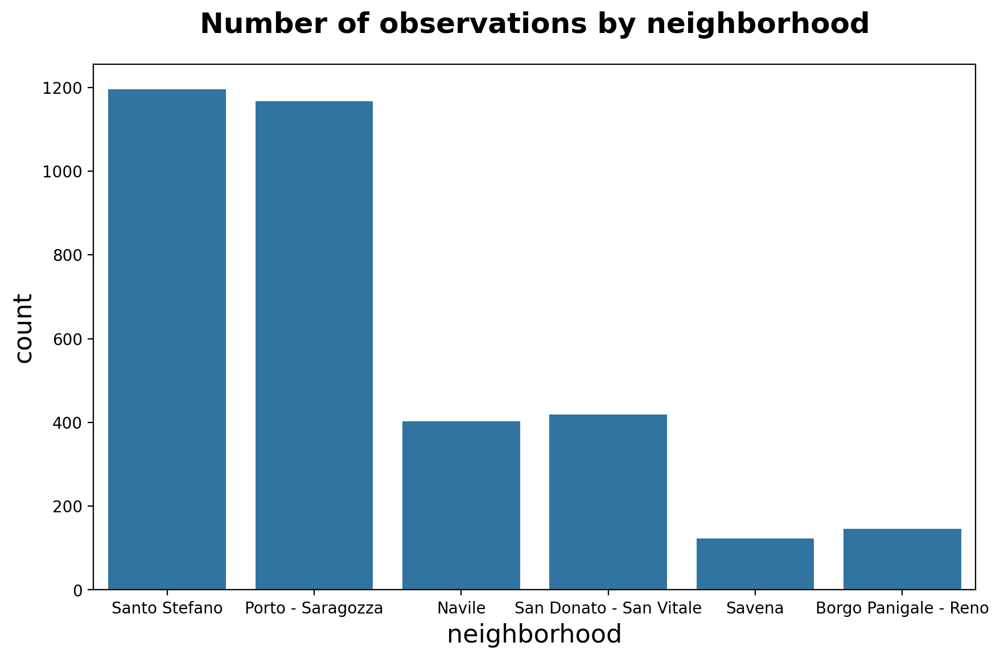

In [15]:
sns.countplot(x="neighborhood", data=df_listings).set(title='Number of observations by neighborhood')

#### Gráfico de Barras - Médias

Se, em vez disso, quisermos ver a distribuição de outra variável em algum grupo, podemos usar a função sns.barplot().

[Text(0.5, 1.0, 'Average price by neighborhood')]

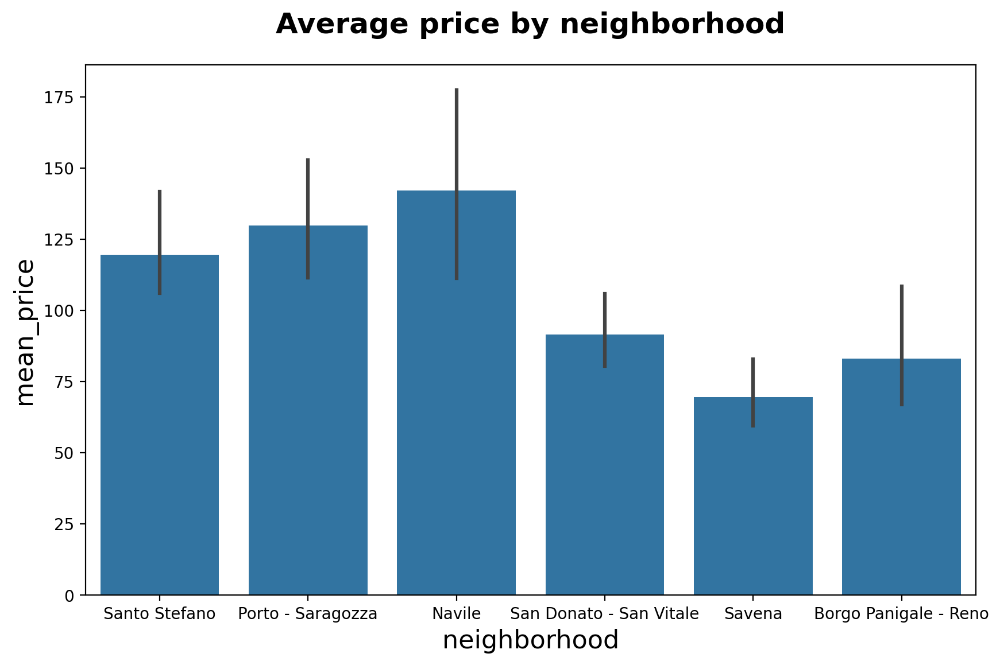

In [16]:
sns.barplot(x="neighborhood", y="mean_price", data=df_listings).set(title='Average price by neighborhood')

#### Gráfico de Barras - Mediana

[Text(0.5, 1.0, 'Median price by neighborhood')]

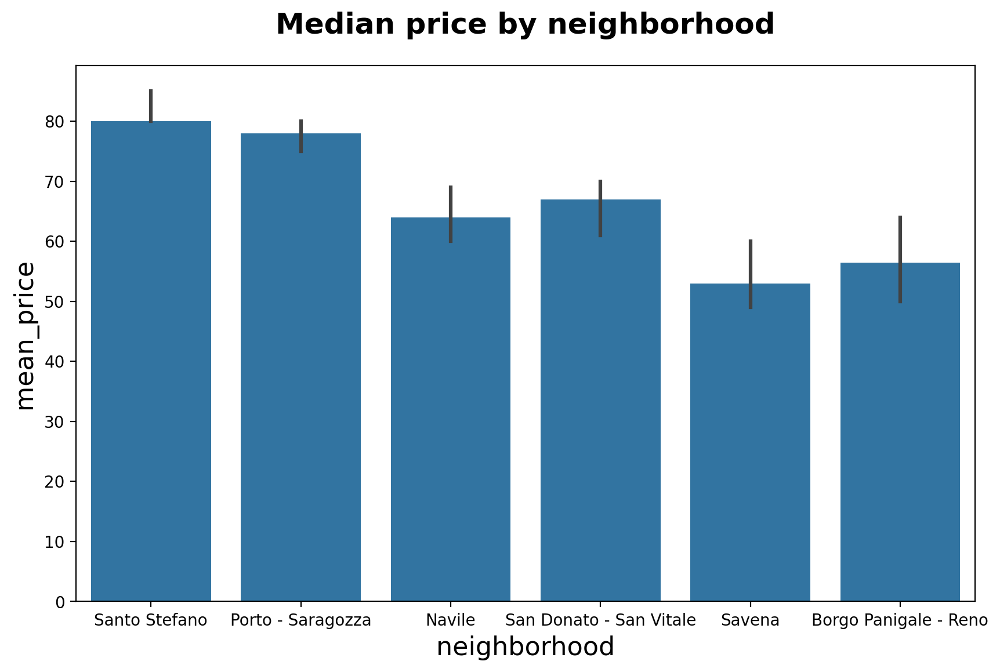

In [17]:
sns.barplot(x="neighborhood", y="mean_price", data=df_listings, estimator=np.median).set(title='Median price by neighborhood')

#### Gráfico de Caixas - Boxplot

O Boxplot é um gráfico que fornece uma visão geral da distribuição dos dados, destacando os valores atípicos (outliers) e a dispersão dos dados.

O Boxplot é composto por:
* Linha central: Mediana (50% dos dados estão abaixo e 50% acima)
* Caixa: 25% a 75% dos dados (intervalo interquartil)
* Bigodes: 1,5 vezes o intervalo interquartil (IQR) acima e abaixo da caixa
* Pontos: Outliers (valores fora do intervalo interquartil)

[Text(0.5, 1.0, 'Price distribution across neighborhoods')]

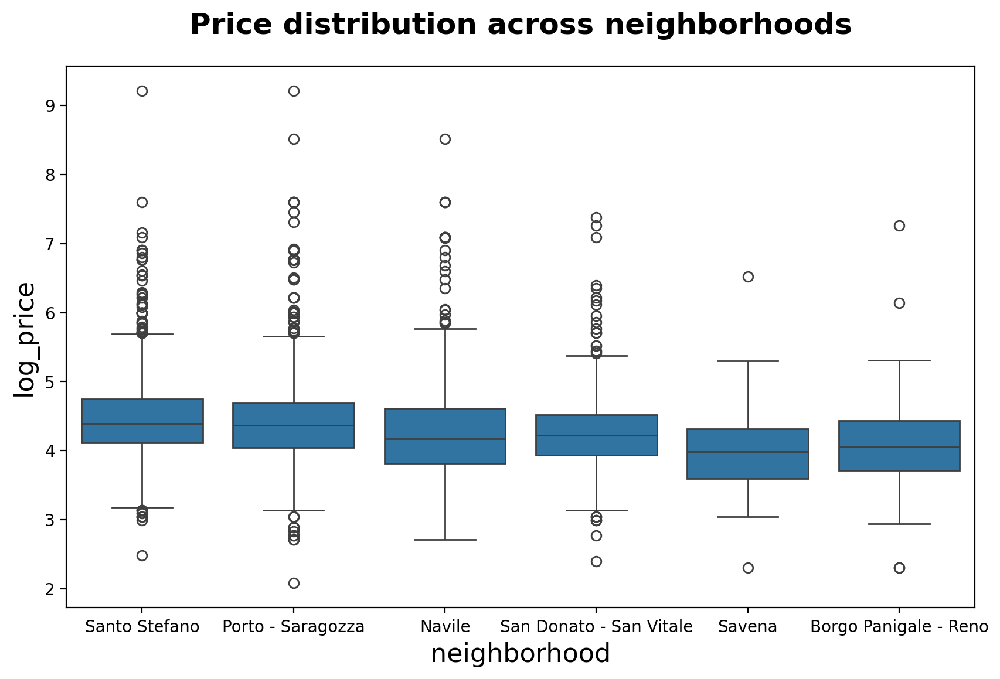

In [18]:
sns.boxplot(x="neighborhood", y="log_price", data=df_listings).set(title='Price distribution across neighborhoods')

#### Gráfico de Violino

O Gráfico de Violino é uma combinação de um boxplot e um histograma de densidade (KDE). Ele mostra a distribuição dos dados em diferentes categorias, permitindo visualizar a densidade dos valores.



[Text(0.5, 1.0, 'Price distribution across neighborhoods')]

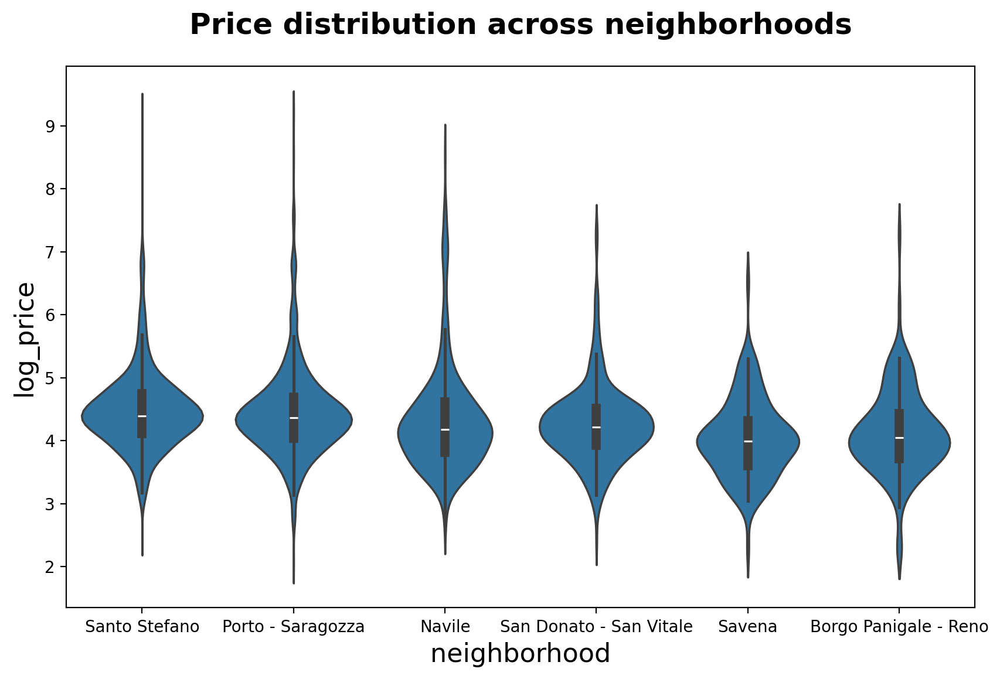

In [19]:
sns.violinplot(x="neighborhood", y="log_price", data=df_listings).set(title='Price distribution across neighborhoods')

#### Gráfico de Linha temporal - Time Series

Esse é um Gráfico que mostra a variação de uma variável ao longo do tempo.

[Text(0.5, 1.0, 'Price distribution over time')]

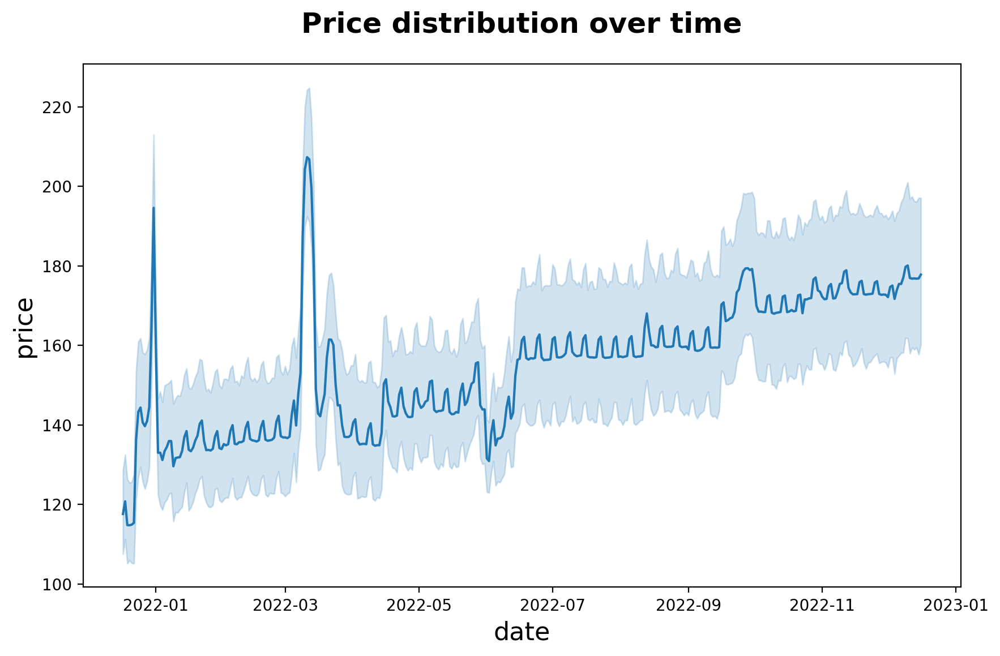

In [20]:
sns.lineplot(data=df, x='date', y='price').set(title="Price distribution over time")

Agora vamos realizar o gráfico de linha temporal para cada bairro (neighborhood) do DataFrame df. 

[Text(0.5, 1.0, 'Price distribution over time')]

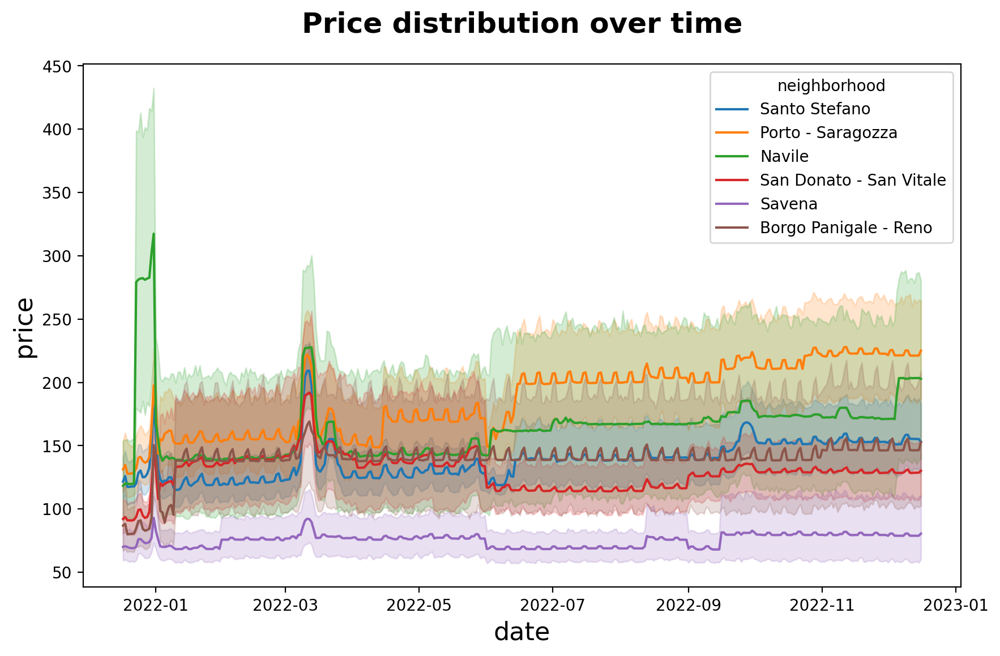

In [21]:
sns.lineplot(data=df, x='date', y='price', hue='neighborhood').set(title="Price distribution over time")

#### Gráfico de Dispersão - Scatter Plot


Vamos criar um gráfico de dispersão (*scatter plot*), que mostra a relação entre o número de avaliações por mês (review per month) e o preço de acomodações.

In [22]:
df_listings["log_rpm"] = np.log(1 + df_listings["reviews_per_month"])

Agora vamos criar um gráfico de dispersão (*scatter plot*) que mostra a relação entre o número de avaliações por mês (review per month) e o preço de acomodações.

[Text(0.5, 1.0, 'Prices and Reviews')]

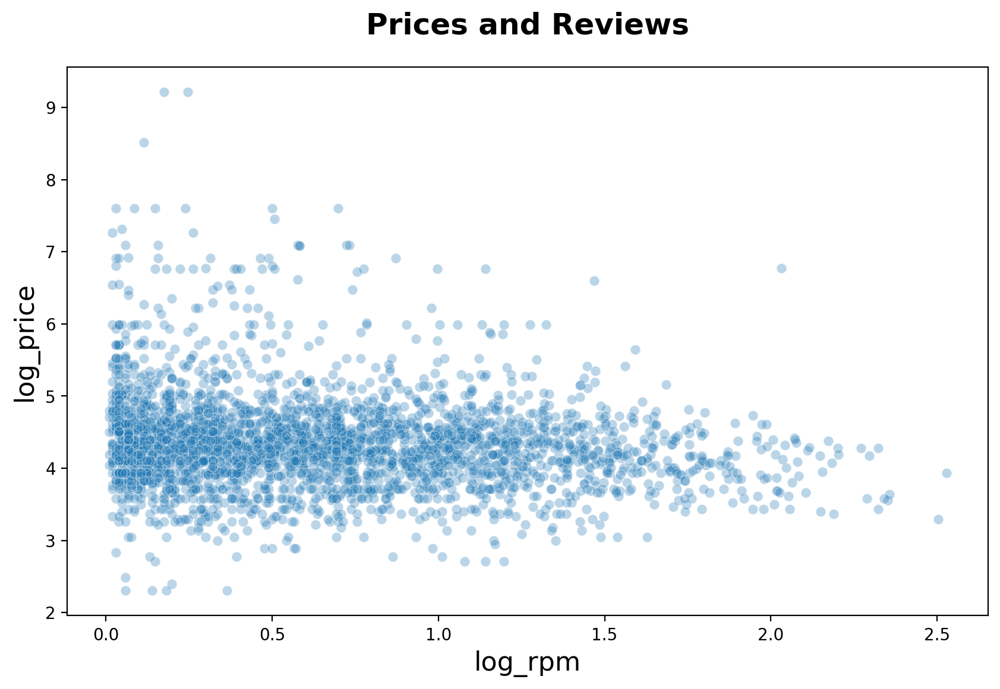

In [23]:
sns.scatterplot(data=df_listings, x="log_rpm", y="log_price", alpha=0.3).set(title='Prices and Reviews')

Podemos adicionar ao gráfico de dispersão uma linha de regressão linear que mostra a tendência geral dos dados. Isso pode ser feito usando a função sns.regplot().

[Text(0.5, 1.0, 'Price and Reviews')]

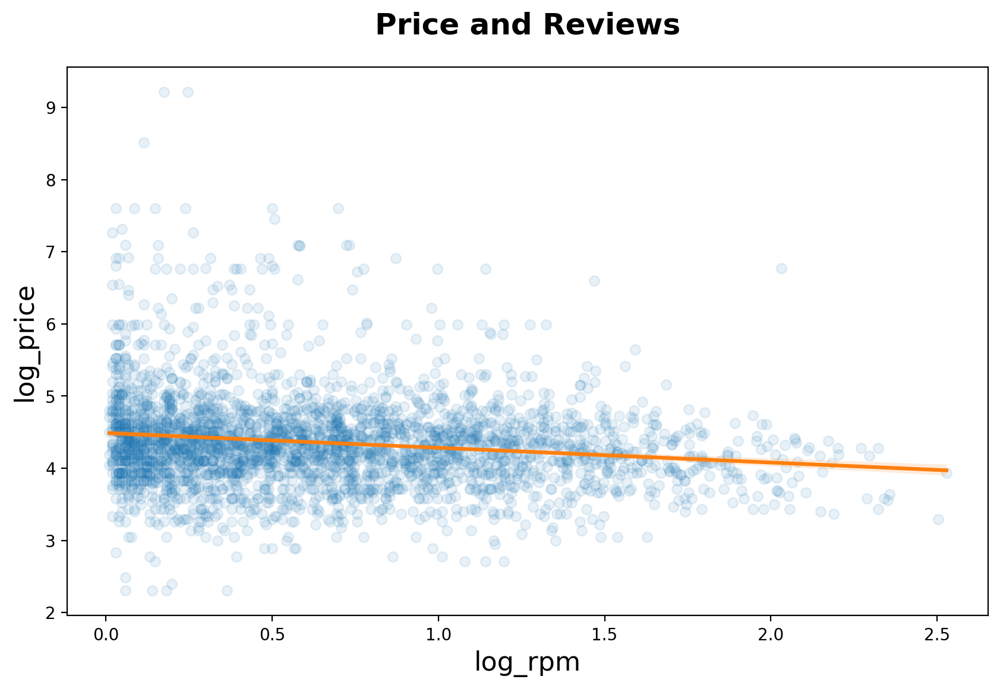

In [24]:
sns.regplot(x="log_rpm", y="log_price", data=df_listings, scatter_kws={'alpha':.1}, line_kws={'color':'C1'}).set(title='Price and Reviews')

Observação: será que todos os dados estão sendo plotados? Temos valores ausentes (NaN) que podem estar afetando a plotagem. Vamos remover esses valores antes de prosseguir.

In [25]:
df_listings[["log_rpm", "log_price"]].isnull().sum()

log_rpm      409
log_price      0
dtype: int64

* A coluna `log_rpm` possui 409 valores ausentes.
* A coluna `log_price` não possui valores ausentes (0 valores ausentes).

In [26]:
df_listings[["log_rpm", "log_price"]].describe()

,log_rpm,log_price
count,3044.000000,3453.000000
mean,0.661105,4.388286
std,0.505924,0.691244
min,0.009950,2.079442
25%,0.239017,3.988984
50%,0.559616,4.317488
75%,1.000632,4.653960
max,2.528126,9.210340


Repare na diferença da contagem das informações nas colunas `log_rpm` e `log_price`.

#### Gráfico de Dispersão - Bins Scatter Plot

Se quisermos uma representação mais flexível dos dados, podemos usar o binscatterpacote. binscatterdivide os dados em compartimentos de tamanhos iguais e exibe um gráfico de dispersão das médias.

Eu instalei o pacote `binscatter`, o qual altera o matplotlib para permitir a plotagem de gráficos de dispersão com ajuste de bins. 

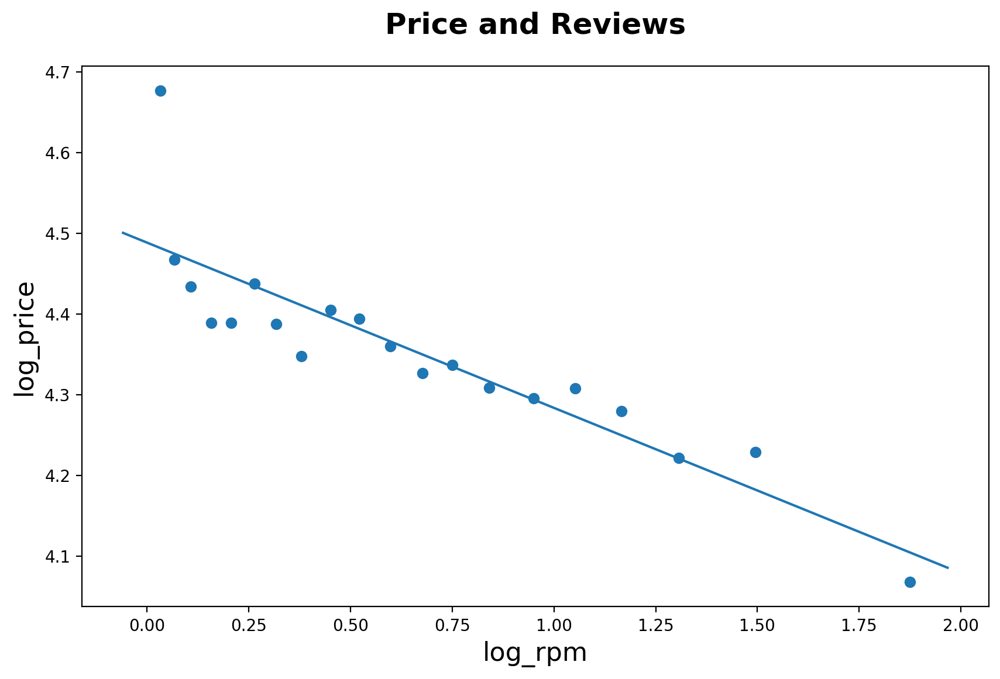

In [27]:
import binscatter

# Remove nans
temp = df_listings[["log_rpm", "log_price"]].dropna()

# Criar gráfico binscatter com número de bins ajustado
fig, ax = plt.subplots()
ax.binscatter(temp["log_rpm"], temp["log_price"])  # sem alterar a sugestão inicial de bins

ax.set_title('Price and Reviews')
plt.show()


Repare que o `binscatter` é uma função do Matplotlib (no início da aula importamos: `import matplotlib.pyplot as plt`, e agora estamos trabalhando em `ax = plt.subplots()`), que cria um gráfico de dispersão com bins (intervalos) e uma regressão linear. Nos chama atenção:
* Os pontos são reduzidos para apenas 20, porque binscatter divide os valores do eixo X (log_rpm) em intervalos (bins) e calcula a média de log_price dentro de cada intervalo.
* Isso suaviza o gráfico, reduzindo a quantidade de pontos e facilitando a visualização da tendência geral.
* A reta representa uma regressão linear dos pontos agrupados.

Vamos aumentar para 50 bins:

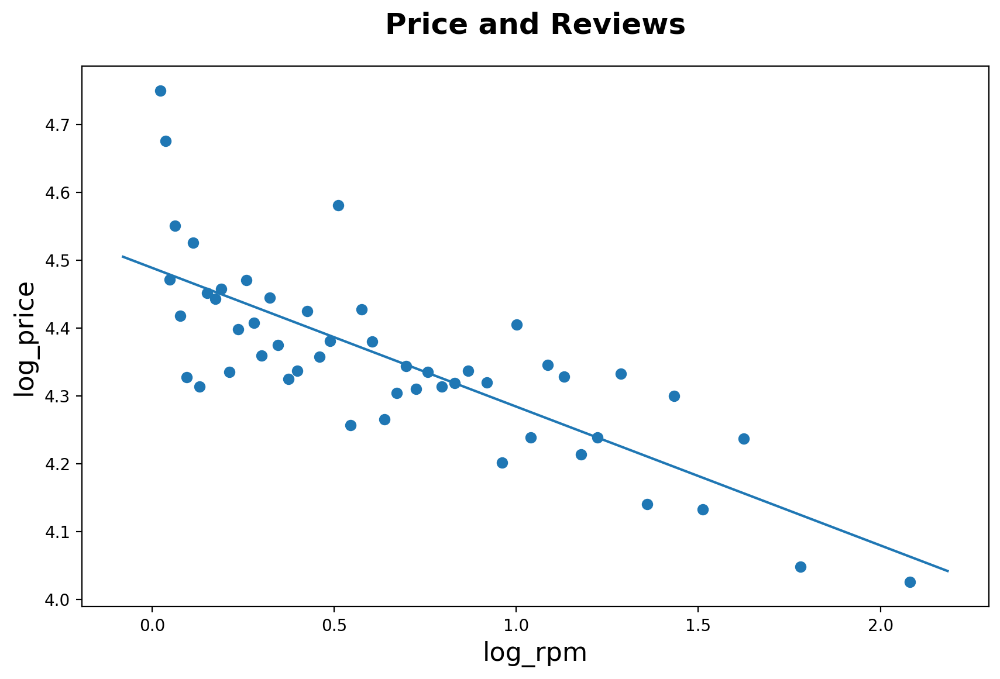

In [28]:
import binscatter

# Remove nans
temp = df_listings[["log_rpm", "log_price"]].dropna()

# Criar gráfico binscatter com número de bins ajustado
fig, ax = plt.subplots()
ax.binscatter(temp["log_rpm"], temp["log_price"], n_bins=50)  # aumentando os bins

ax.set_title('Price and Reviews')
plt.show()

Agora vamos trabalhar mais nosso gráfico de dispersão inicial, utilizando o `seaborn` ou como foi carregado inicialmente: `sns`.

[Text(0.5, 1.0, 'Prices and Ratings, by room type')]

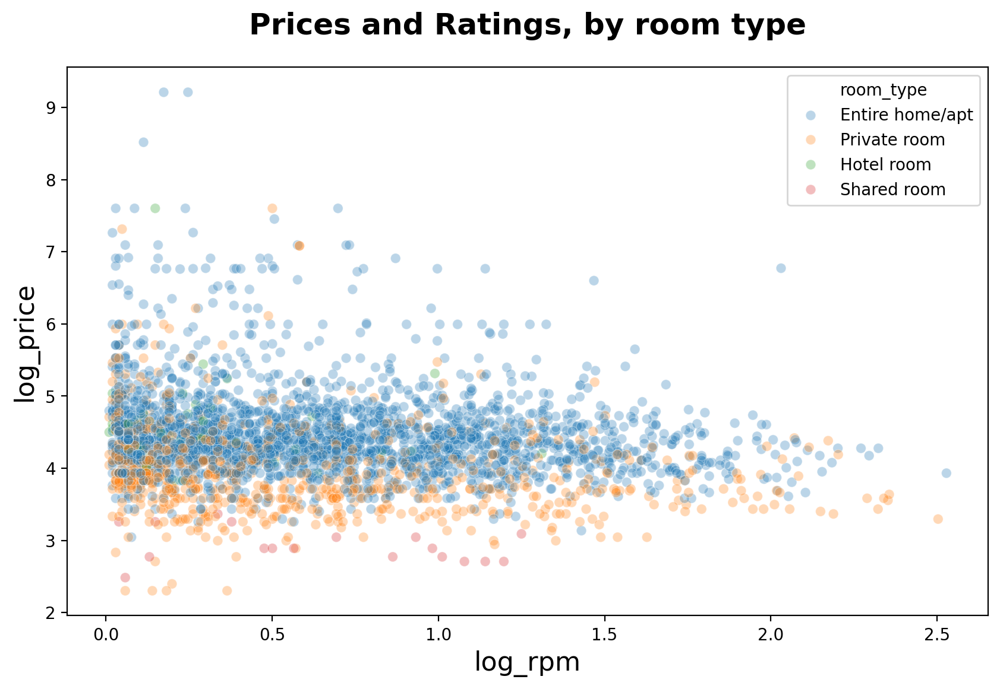

In [29]:
sns.scatterplot(data=df_listings, x="log_rpm", y="log_price", hue="room_type", alpha=0.3).set(title="Prices and Ratings, by room type")

Temos o gráfico de dispersão (scatter plot) usando seaborn, onde os pontos são coloridos de acordo com a variável room_type.

#### Gráfico de Dispersão Bivariado - com Histogramas Marginais

Vamos criar um gráfico de dispersão bivariado com histogramas marginais, que mostra a relação entre duas variáveis e exibe a distribuição marginal de cada uma delas nas bordas.

Além disso, vamos considerar um tipo hexagonal de plotagem, que é útil para visualizar a densidade de pontos em áreas com muitos dados.

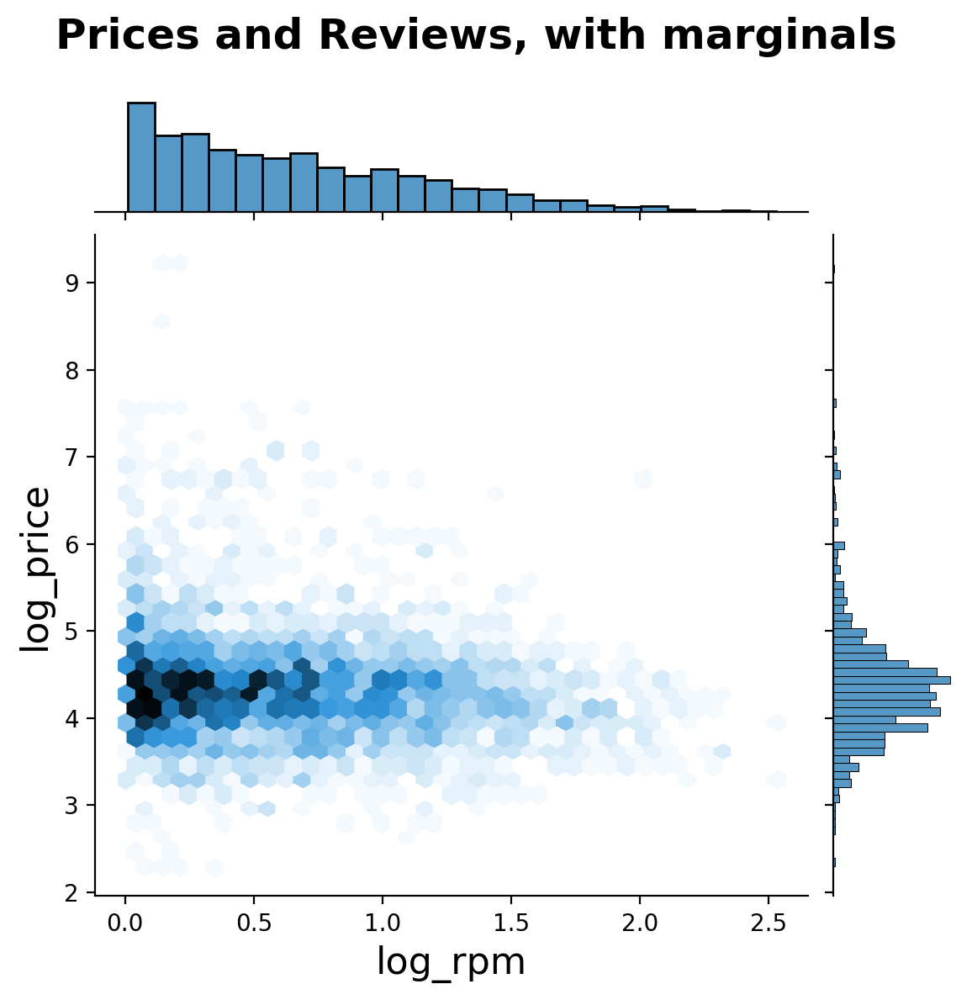

In [30]:
sns.jointplot(data=df_listings, x="log_rpm", y="log_price", kind="hex").fig.suptitle("Prices and Reviews, with marginals")
plt.subplots_adjust(top=0.9)

#### Gráficos de Correlação

Temos outra variável disponível no DataFrame df_listings, chamada 'number_of_reviews', que indica o número total de avaliações que a listagem recebeu. Essa variável pode estar correlacionada com o preço e com 'reviews_per_month', que indica a média de avaliações por mês.

vamos criá-la da mesma forma que fizemos com 'reviews_per_month', mas agora para 'number_of_reviews'.

In [31]:
df_listings["log_reviews"] = np.log(1 + df_listings["number_of_reviews"])

Agora vamos usar o seaborn, especificamente a função `sns.pairplot()`, para criar um gráfico de dispersão das variáveis discutidas até aqui.

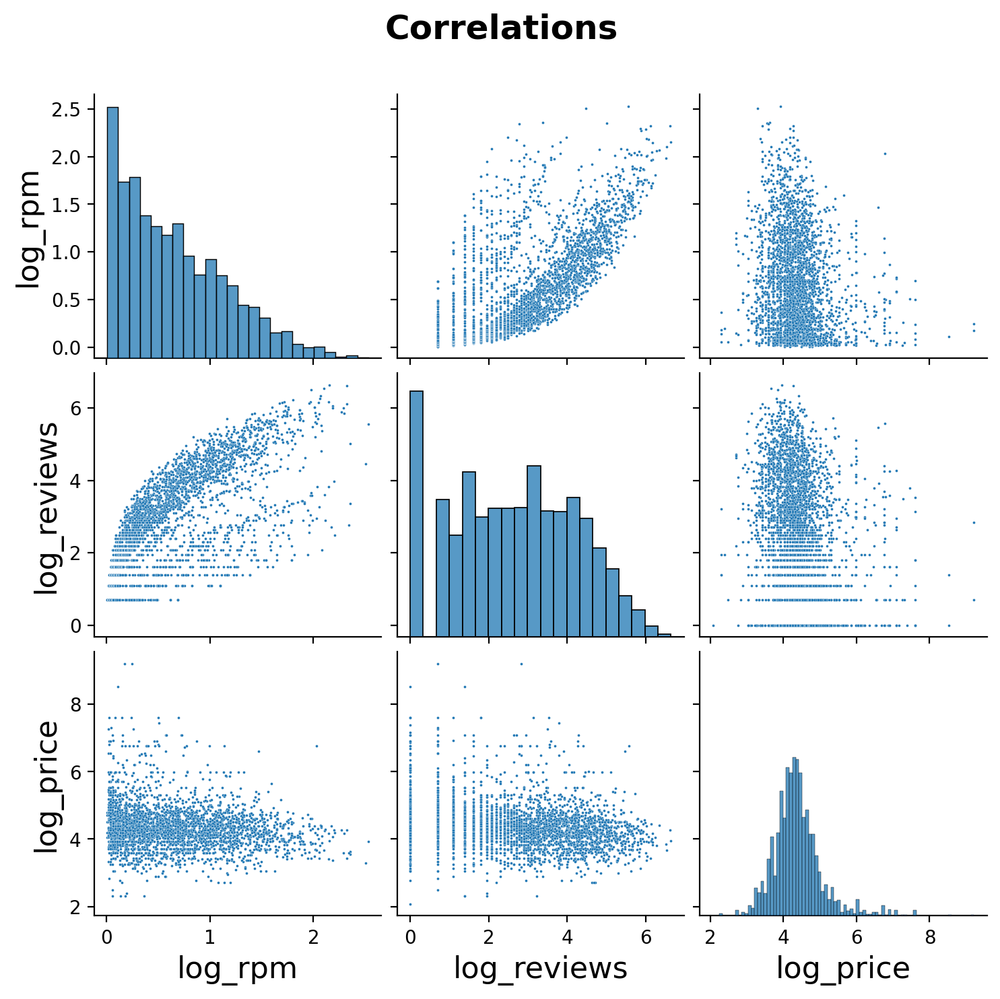

In [32]:
sns.pairplot(data=df_listings, vars=["log_rpm", "log_reviews", "log_price"], plot_kws={'s':2}).fig.suptitle("Correlations")
plt.subplots_adjust(top=0.9)

Vamos as correlações considerando o número de quartos (vamos olhar no `hue='room_type'`) para ver se há alguma diferença.

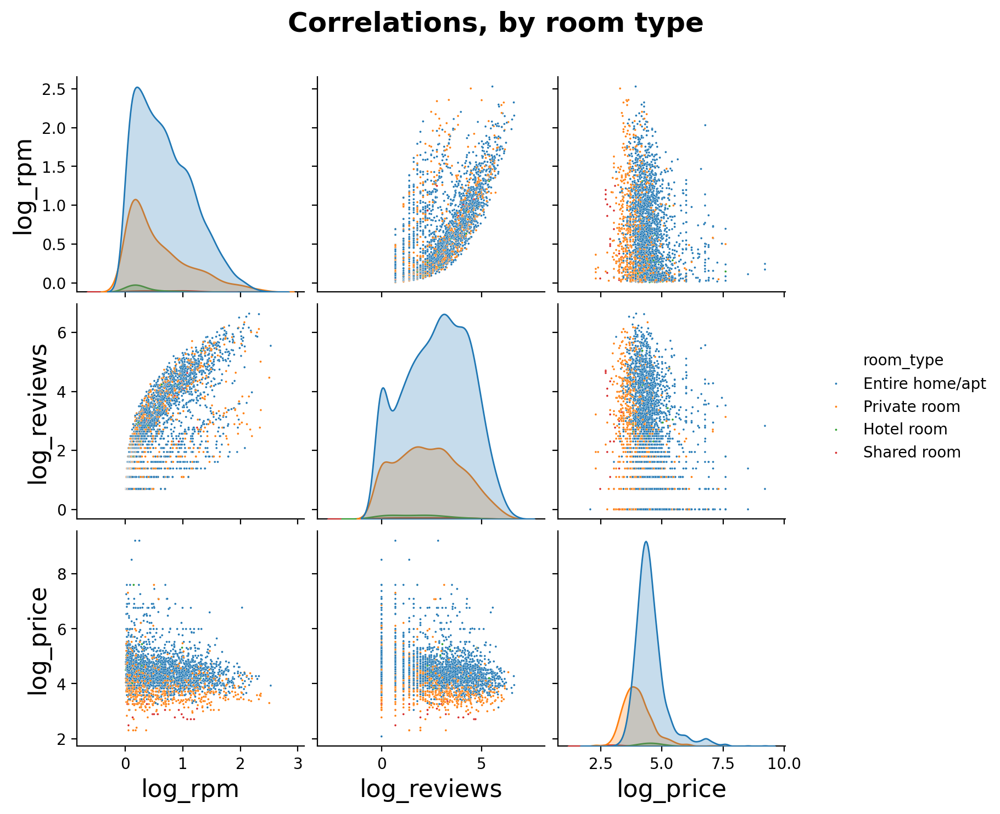

In [33]:
sns.pairplot(data=df_listings, vars=["log_rpm", "log_reviews", "log_price"], hue='room_type', plot_kws={'s':2}).fig.suptitle("Correlations, by room type")
plt.subplots_adjust(top=0.9)

Podemos adicionar uma linha de regressão linear para cada par de variáveis, bem como histogramas para cada variável individual.

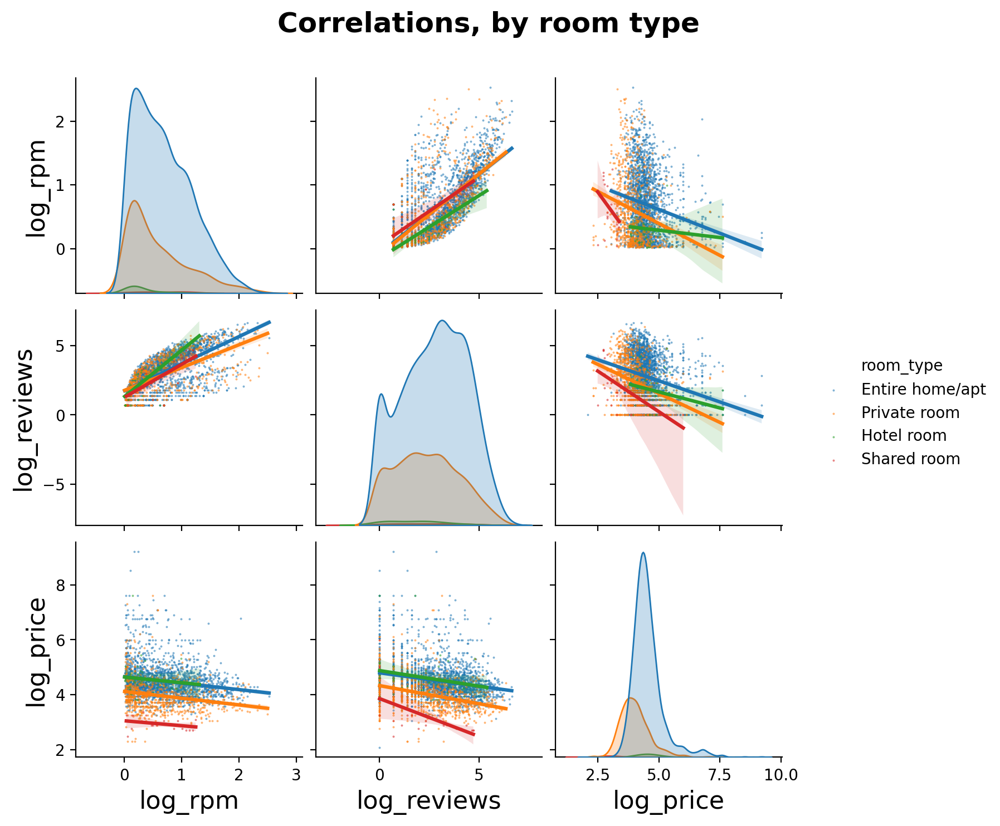

In [34]:
sns.pairplot(data=df_listings,
             vars=["log_rpm", "log_reviews", "log_price"],
             kind="reg",
             hue='room_type',
             plot_kws={'scatter_kws':{'s':.1}})\
.fig.suptitle("Correlations, by room type");
plt.subplots_adjust(top=0.9)

#### Mapa de Calor - Heatmap

Vamos gerar um mapa de calor (*heatmap*) das correlações entre as variáveis numéricas do DataFrame *df*.

C:\Users\danie\AppData\Local\Temp\ipykernel_22484\1155969258.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), vmin=-1, vmax=1, linewidths=.5, cmap="RdBu").set(title="Correlations")


[Text(0.5, 1.0, 'Correlations')]

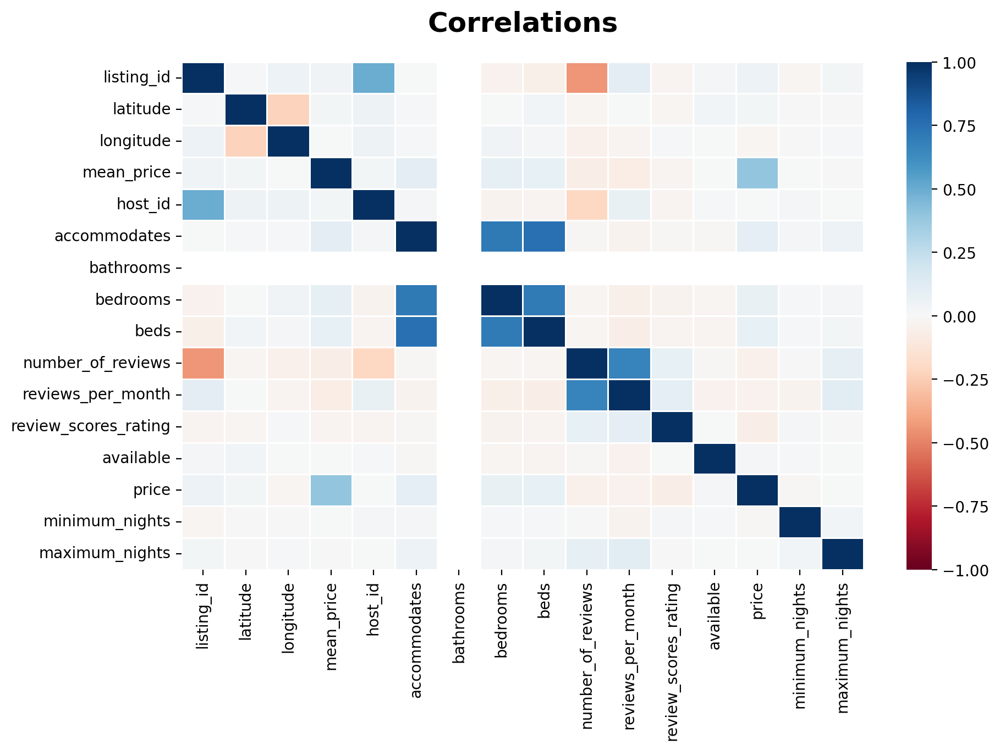

In [35]:
sns.heatmap(df.corr(), vmin=-1, vmax=1, linewidths=.5, cmap="RdBu").set(title="Correlations")

***visualização alternativa da matriz de correlação, usando pontos em vez de um mapa de calor***.

C:\Users\danie\AppData\Local\Temp\ipykernel_22484\3593044933.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_mat = df.corr().stack().reset_index(name="correlation")


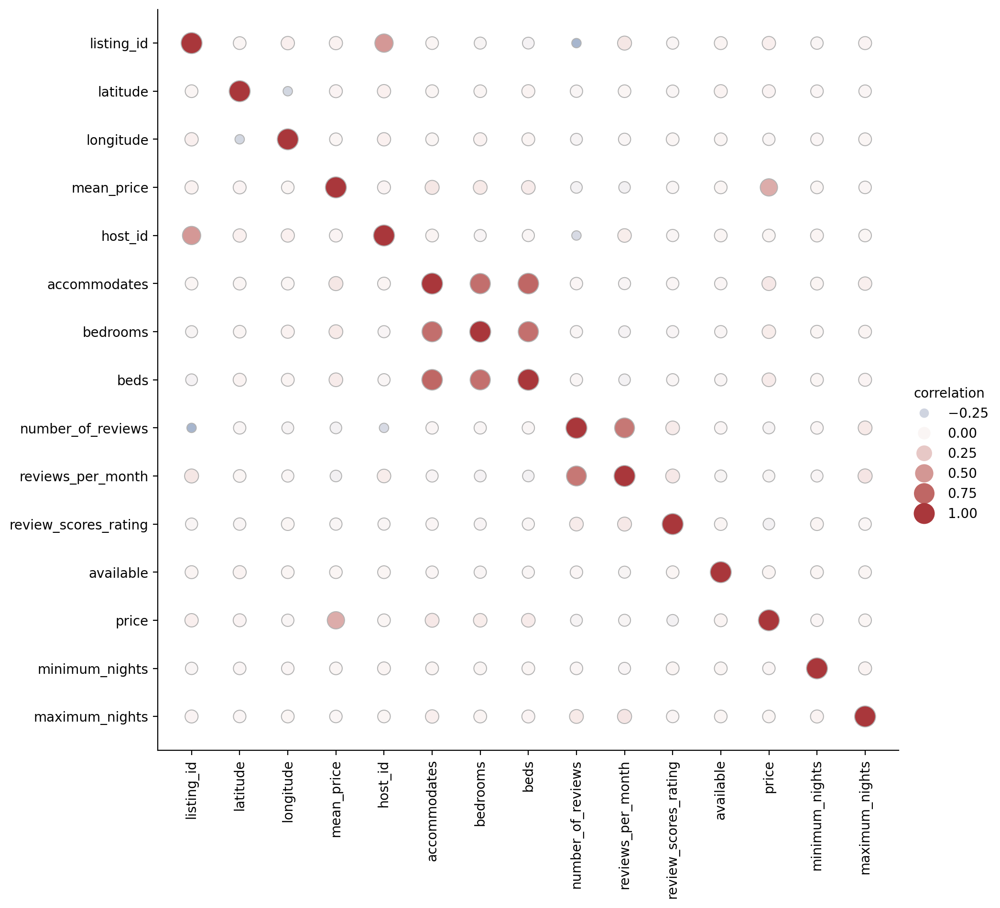

In [36]:
# Compute a correlation matrix and convert to long-form
corr_mat = df.corr().stack().reset_index(name="correlation")

# Draw each cell as a scatter point with varying size and color
g = sns.relplot(data=corr_mat,
            x="level_0", y="level_1", hue="correlation", size="correlation",
            palette="vlag", hue_norm=(-1, 1), edgecolor=".7",
            height=10, sizes=(50, 250), size_norm=(-.2, .8));

# Extra cleaning
for label in g.ax.get_xticklabels():
    label.set_rotation(90)
g.set(xlabel="", ylabel="", aspect="equal");

* A cor representa o coeficiente de correlação (negativo em cinza, positivo em vermelho).
* O tamanho dos pontos representa a magnitude da correlação (quanto maior, mais forte a relação).
* Os eixos X e Y representam as variáveis do DataFrame df.

#### Mapa Geográfico/Espacial - Localização Espacial

Vamos gerar um gráfico de dispersão geográfico, onde **cada ponto representa a localização de um imóvel** ou listagem no dataset `df_listings`. 

[Text(0.5, 1.0, 'Listing coordinates')]

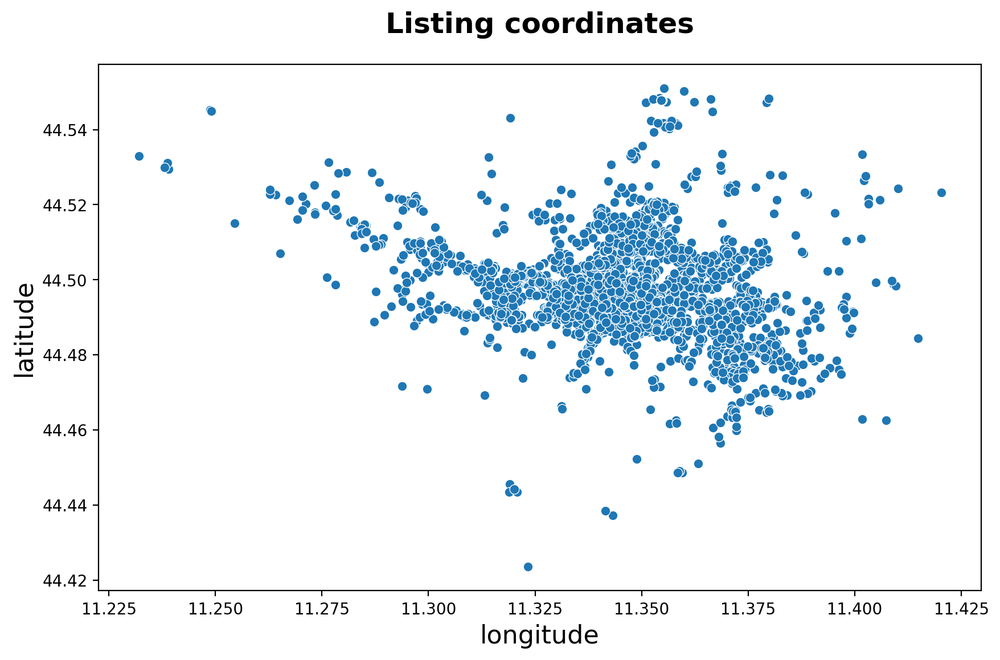

In [37]:
sns.scatterplot(data=df_listings, x="longitude", y="latitude").set(title='Listing coordinates')

Precisamos converter um DataFrame Pandas (df_listings) para um GeoDataFrame do GeoPandas, criando pontos geográficos a partir das colunas de latitude e longitude e transformando o sistema de coordenadas. 

In [38]:
import geopandas

geom = geopandas.points_from_xy(df_listings.longitude, df_listings.latitude)
gdf = geopandas.GeoDataFrame(df_listings, geometry=geom, crs=4326).to_crs(3857)

Criamos pontos geográficos a partir das colunas longitude (X) e latitude (Y).
* geopandas.points_from_xy(x, y) → Gera uma série de objetos shapely.geometry.Point.
* Cada ponto representa uma localização geográfica associada a uma listagem do df_listings.

agora vamos buscar o mapa de Bolonha e plotar os pontos das listagens do Airbnb sobre ele. 

<Axes: title={'center': 'Bologna, Emilia-Romagna, Italia'}, xlabel='X', ylabel='Y'>

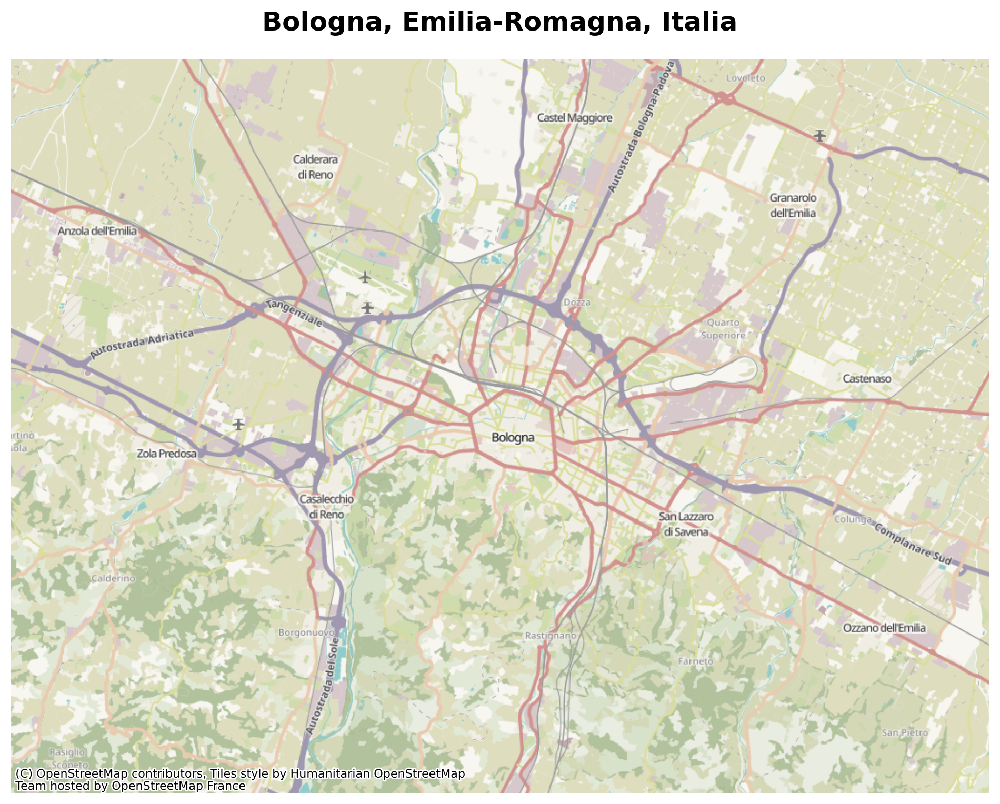

In [39]:
import contextily as cx
# Buscar por Bologna e exibe o mapa
bologna = cx.Place("Bologna")
bologna.plot()

Conseguimos buscar um mapa da cidade de Bolonha (Itália).

Repare que `cx.Place("Bologna")` acessa a API do OpenStreetMap/Nominatim e encontra as coordenadas da cidade.

Agora a variável `bologna` contém um GeoDataFrame representando a área de Bolonha.

<Axes: title={'center': 'Bologna, Emilia-Romagna, Italia'}, xlabel='X', ylabel='Y'>

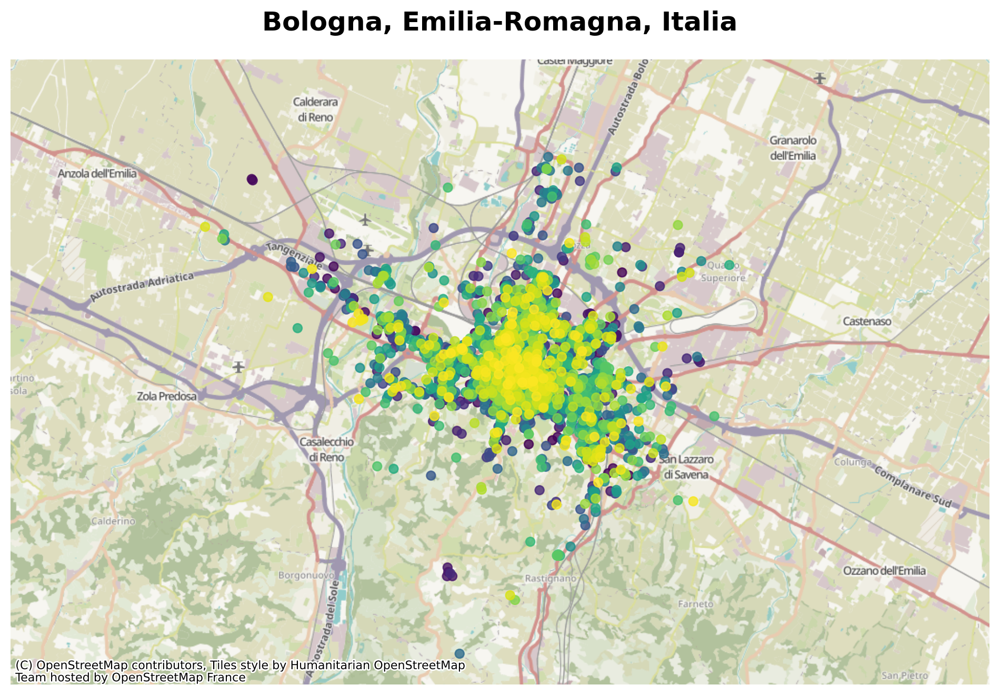

In [40]:
ax = bologna.plot()
ax.set_ylim([5530000, 5555000])
gdf.plot(ax=ax, c=df_listings['mean_price'], cmap='viridis', alpha=0.8)

Plotamos um mapa da cidade de Bolonha sobrepondo os pontos do GeoDataFrame gdf coloridos de acordo com os preços médios (mean_price).

### Mapa Geográfico/Espacial - Localização Espacial (Shapefile)

nesse link: https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2023/Brasil/BR_Municipios_2023.zip temos um arquivo zip com o shapefile municipal do Brasil

Ou seja, o arquivo *.shp é : `BR_Municipios_2023.shp`, e está dentro da pasta zipada.



<Axes: >

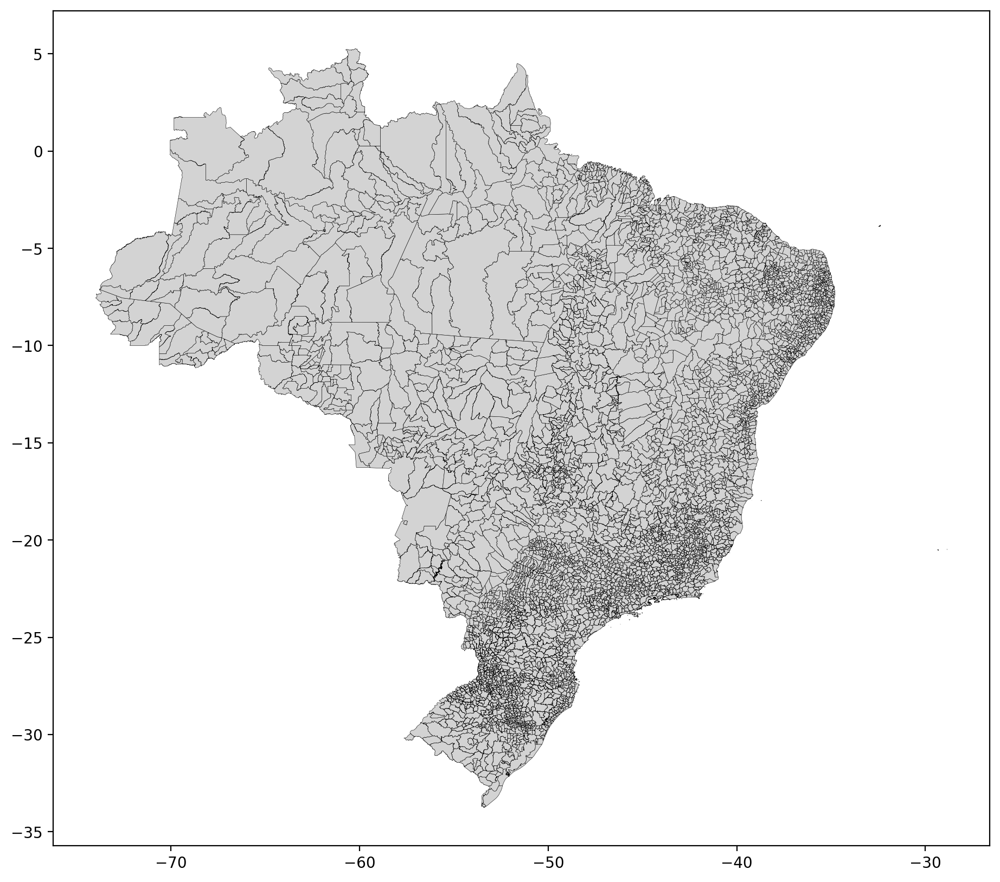

In [41]:
import geopandas as gpd
import requests
import zipfile
import io

# URL do shapefile do IBGE
url_Mun_shp = "https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2023/Brasil/BR_Municipios_2023.zip"

# Baixar o arquivo ZIP
response = requests.get(url_Mun_shp)
zip_file = zipfile.ZipFile(io.BytesIO(response.content))

# Extrair para uma pasta temporária
extract_path = "BR_Municipios_2023"
zip_file.extractall(extract_path)

# Caminho do shapefile extraído
shapefile_path = f"{extract_path}/BR_Municipios_2023.shp"

# Carregar o shapefile com GeoPandas
gdf = gpd.read_file(shapefile_path)

# Plotar o mapa
gdf.plot(figsize=(12,10), color="lightgray", edgecolor="black", linewidth=0.2)

### Gráfico de densidade entre dois grupos - KDE

In [11]:
import pandas as pd

# DataFrame
df = pd.read_stata("https://github.com/Daniel-Uhr/data/raw/main/cattaneo2.dta")

# Criar a variável de resultado Y
df['Y'] = df['bweight']

# Criar a variável de tratamento 'Treated' com valor inicial de 0
df['Treated'] = 0
# Recodificar a variável de tratamento 'Treated' para 1 se 'mbsmoke' for igual a 'smoker'
df.loc[df['mbsmoke'] == 'smoker', 'Treated'] = 1

Gráfico de densidade de Kernel (KDE) do peso dos bebês recem nascidos entre os grupos de gestantes fumantes e não fumamantes.

<Axes: xlabel='Y', ylabel='Density'>

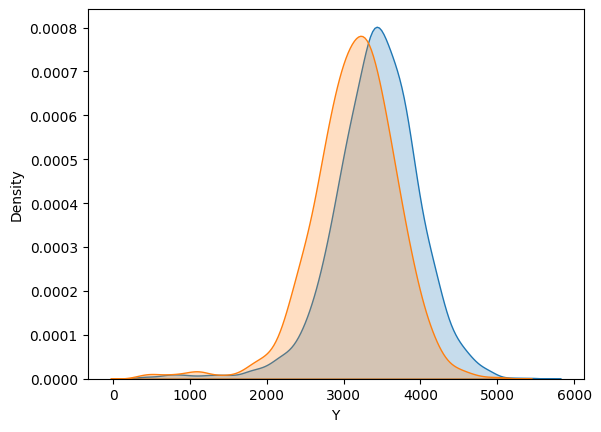

In [12]:
import seaborn as sns

# Vejamos a distribuição do peso dos bebês para fumantes e não fumantes, marcando a média de cada grupo
sns.kdeplot(df[df['Treated'] == 0]['Y'], fill=True, label='Não fumantes')
sns.kdeplot(df[df['Treated'] == 1]['Y'], fill=True, label='Fumantes')

## Considerações Finais

Neste notebook, exploramos diversos tipos de gráficos com `Matplotlib` e `Seaborn`, aprendendo a:
- Criar gráficos básicos como linha, dispersão e barras.
- Personalizar títulos, cores, eixos e legendas.
- Trabalhar com visualizações mais avançadas, como `heatmaps` e `boxplots`.
- Explorar gráficos geoespaciais usando `GeoPandas`.

Para continuar aprofundando-se no tema, recomenda-se estudar:
- Documentação oficial do `Matplotlib` e `Seaborn`.
- Técnicas de **Storytelling com Dados** para criar visualizações mais impactantes.
- Uso de dashboards interativos com `Plotly` e `Dash`.